jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000

In [1]:
import networkx as nx
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import random
import copy
import heapq

In [2]:
df = pd.read_csv('C:/Projects IT/Python/Projet Metaheuristic/project.csv', sep =';')
nameTable = pd.read_csv('C:/Projects IT/Python/Projet Metaheuristic/indexStation.csv', sep =';')

df

,Station,Connection,Time
0,0,238,41.0
1,0,159,46.0
2,1,12,36.0
3,1,235,44.0
4,2,110,69.0
5,2,139,50.0
6,3,262,33.0
7,3,210,41.0
8,4,171,43.0
9,4,251,35.0


In [3]:
MG = nx.MultiGraph()

In [4]:
for i in range(0, len(df.Station)):
    MG.add_edge(df.Station[i], df.Connection[i], weight=df.Time[i])

In [5]:
MG

In [6]:
print(MG.adj)

{0: {238: {0: {'weight': 41.0}, 1: {'weight': 41.0}}, 159: {0: {'weight': 46.0}, 1: {'weight': 46.0}}}, 238: {0: {0: {'weight': 41.0}, 1: {'weight': 41.0}}, 322: {0: {'weight': 27.0}, 1: {'weight': 27.0}}, 239: {0: {'weight': 120.0}, 1: {'weight': 120.0}}}, 159: {0: {0: {'weight': 46.0}, 1: {'weight': 46.0}}, 147: {0: {'weight': 44.0}, 1: {'weight': 44.0}}}, 1: {12: {0: {'weight': 36.0}, 1: {'weight': 36.0}}, 235: {0: {'weight': 44.0}, 1: {'weight': 44.0}}}, 12: {1: {0: {'weight': 36.0}, 1: {'weight': 36.0}}, 213: {0: {'weight': 42.0}, 1: {'weight': 42.0}}}, 235: {1: {0: {'weight': 44.0}, 1: {'weight': 44.0}}, 284: {0: {'weight': 44.0}, 1: {'weight': 44.0}}}, 2: {110: {0: {'weight': 69.0}, 1: {'weight': 69.0}}, 139: {0: {'weight': 50.0}, 1: {'weight': 50.0}}}, 110: {2: {0: {'weight': 69.0}, 1: {'weight': 69.0}}, 332: {0: {'weight': 37.0}, 1: {'weight': 37.0}}, 109: {0: {'weight': 120.0}, 1: {'weight': 120.0}}}, 139: {2: {0: {'weight': 50.0}, 1: {'weight': 50.0}}, 355: {0: {'weight': 46

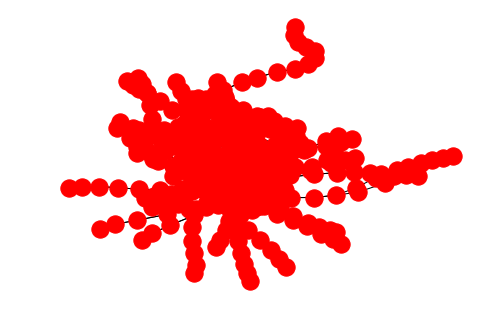

In [7]:
nx.draw(MG, label=True)
plt.show()

In [8]:
shortestMulti = nx.johnson(MG)
print(shortestMulti)
print(shortestMulti[1][5])
print(shortestMulti[1][5][1])

{0: {0: [0], 238: [0, 238], 159: [0, 159], 322: [0, 238, 322], 239: [0, 238, 239], 147: [0, 159, 147], 217: [0, 238, 322, 217], 191: [0, 159, 147, 191], 353: [0, 238, 322, 217, 353], 325: [0, 238, 322, 217, 353, 325], 194: [0, 159, 147, 191, 194], 192: [0, 159, 147, 191, 192], 5: [0, 238, 239, 5], 27: [0, 238, 239, 27], 175: [0, 238, 322, 217, 353, 325, 175], 327: [0, 238, 322, 217, 353, 325, 327], 326: [0, 238, 322, 217, 353, 325, 326], 276: [0, 159, 147, 191, 194, 276], 13: [0, 238, 239, 5, 13], 246: [0, 238, 239, 27, 246], 64: [0, 159, 147, 191, 192, 64], 337: [0, 159, 147, 191, 192, 337], 151: [0, 238, 239, 5, 13, 151], 14: [0, 159, 147, 191, 192, 64, 14], 302: [0, 238, 239, 27, 246, 302], 245: [0, 238, 322, 217, 353, 325, 326, 168, 245], 268: [0, 159, 147, 191, 192, 337, 268], 366: [0, 238, 239, 27, 246, 302, 366], 103: [0, 238, 322, 217, 353, 325, 327, 103], 132: [0, 238, 322, 217, 353, 325, 327, 132], 168: [0, 238, 322, 217, 353, 325, 326, 168], 202: [0, 238, 322, 217, 353, 325,

In [21]:
class Chromosome:
    def __init__(self, nodes):
        self.nodes = nodes       
    
    def shuffleGenes(self):
        random.shuffle(self.nodes)   
    
    #Order Changing Mutation, 1 gene is selected thanks to Pm probability then swapped with the other node(cant duplicate)
    def mutationGene(self, Pm):
        self.Pm = Pm
        for i in range(0, len(self.nodes)):
            self.randMutate = random.random()
            if self.randMutate < self.Pm:
                self.mutateTo = random.randint(0,len(self.nodes)-1)
                self.tmpGene = copy.copy(self.nodes[i])
                self.nodes = np.where(self.nodes == self.mutateTo, self.tmpGene, self.nodes)
                self.nodes[i] = self.mutateTo

    def pathWay(self, Multigraph): #Multigraph come from the Johnson Networkx calculation for shortest path between 2 nodes
        self.Multigraph = Multigraph
        self.totalPath = []
        for i in range(0, len(self.nodes)-1):        
            if i+1 is not None:
                self.totalPath = merge(self.totalPath, self.Multigraph[self.nodes[i]][self.nodes[i+1]])   
        return self.totalPath
        
    def __repr__(self):
        self.strNodes = "Chromosome :"
        for i in self.nodes:
            self.node = str(i)
            self.strNodes = self.strNodes + "|" + self.node
        self.strNodes = self.strNodes + "|"
        return self.strNodes

In [22]:
#Crossover PErmutation Encoding (1)ABC DEF + (2)DAB CFE --> ABC(1) DFE (in the order of the 2d chromosome genes)
def crossoverPermutation(chromo1, chromo2):
    lenChromo = int(len(chromo1.nodes) / 2)
    childrenChr = chromo1.nodes[0:lenChromo]
    for i in chromo2.nodes:
        if i not in childrenChr:
            childrenChr = np.append(childrenChr, [i])
    return childrenChr
    

In [23]:
def populationGeneration(popsize, nodeList):
    population = []
    for i in range(0,popsize,1):
        nodeList = np.unique(nodeList, axis=0)
        random.shuffle(nodeList)
        population = population + [Chromosome(nodeList)]
    return population

In [24]:
#function can merge 2 list where last element of one(a) is the first element of the second(b)
#for example [1,2,3,4] + [4,5,6] = [1,2,3,4,5,6]
def merge(a, b):
    c = a[:-1] + b[:]
    return c
    

In [25]:
def fitnessScore(uniqueNodeList, chromosome, MultiG):
    fitScore = len(uniqueNodeList.unique()) / len(chromosome.pathWay(MultiG))
    return fitScore

In [ ]:
population = populationGeneration(3, df.Station)
population

In [ ]:
population[1].pathWay(shortestMulti)

In [ ]:
fitnessScore(df.Station, population[1], shortestMulti)

In [ ]:
population[1].mutationGene(0.5)

In [ ]:
Chromosome(crossoverPermutation(population[1], population[2]))

In [31]:
#MAIN LOOP
population = populationGeneration(10, df.Station)
for globalLoob in range(0,50):
    for z in range(0,50):
        fitList = np.array([])
        for i in range(0,len(population)):
            fitList = np.append(fitList, fitnessScore(df.Station, population[i], shortestMulti))
        IndexfitBest = heapq.nlargest(5, range(len(fitList)), fitList.take)
        population_best = np.take(population, IndexfitBest)
        child = [Chromosome(crossoverPermutation(population_best[0], population_best[1]))]
        for u in range(1, len(population_best)):
            child = child + [Chromosome(crossoverPermutation(population_best[u-1], population_best[u]))]
        population = np.append(child, population_best)   
        population[0].mutationGene(0.1)
    for i in range(0,len(population)-1):
        population[i].mutationGene(0.1)
    print(fitList)
    print(population[0])

print(fitList)
print(population)
print(population_best)
print(fitList)

        
        
        
    
  

[0.0753356  0.07701762 0.07711239 0.07711239 0.07711239 0.07747785
 0.07742998 0.07711239 0.07711239 0.07711239]
Chromosome :|180|362|59|207|39|94|87|201|363|331|192|171|286|85|126|320|31|220|336|288|203|183|40|141|143|375|229|33|46|266|225|222|139|134|226|284|244|97|128|327|38|193|318|54|211|195|151|246|324|105|365|161|301|19|69|153|154|44|110|285|118|120|24|135|214|206|92|142|268|55|178|99|89|131|51|298|174|374|78|57|4|81|210|49|297|335|196|112|147|90|15|227|356|45|177|80|16|223|179|72|254|79|352|353|68|138|155|1|62|350|213|2|267|370|144|300|47|261|32|309|197|65|121|5|127|48|35|304|184|20|278|216|218|217|368|73|341|322|360|364|326|344|70|289|13|248|162|58|107|146|169|163|93|271|306|181|328|149|231|160|263|299|265|337|228|276|262|369|8|123|114|159|115|308|182|7|25|296|167|205|255|100|249|71|313|10|108|63|157|347|241|117|221|343|77|325|358|212|43|294|37|333|52|273|277|18|187|293|282|260|116|185|17|53|355|230|373|6|113|137|264|329|82|175|145|34|259|136|250|91|11|359|66|338|303|14|28|361

[0.0755627  0.07994897 0.07994897 0.07994897 0.07994897 0.07998298
 0.07994897 0.07994897 0.07994897 0.07994897]
Chromosome :|323|362|98|207|327|222|193|346|363|331|50|318|286|352|51|320|239|220|48|288|291|81|60|65|180|292|175|358|46|338|6|243|202|191|226|104|244|97|128|234|188|218|99|176|42|195|339|82|43|105|262|161|158|19|69|268|371|122|15|285|118|36|345|370|273|206|375|142|274|57|178|373|89|131|187|156|24|147|78|334|4|3|210|126|299|172|68|368|163|47|30|135|356|45|201|80|322|174|62|72|254|79|192|353|252|138|155|1|179|225|213|315|267|298|144|229|259|266|116|166|365|312|121|301|284|109|35|70|343|20|278|140|87|289|283|73|341|119|360|39|326|344|26|165|223|306|162|305|107|146|214|261|93|271|17|190|84|287|134|125|37|96|265|337|228|14|197|185|150|123|114|127|115|77|293|7|330|296|167|294|13|100|249|177|143|10|108|106|359|9|347|335|136|314|169|209|231|208|160|75|55|350|233|215|21|61|366|76|355|199|198|117|303|49|204|203|173|103|241|40|236|151|0|308|311|83|154|332|348|52|130|316|67|145|263|33|

[0.07628322 0.07854606 0.07914123 0.07914123 0.07914123 0.0801364
 0.07929144 0.07914123 0.07914123 0.07914123]
Chromosome :|323|211|98|375|327|30|251|177|193|331|50|171|286|257|104|320|272|317|336|288|227|95|80|312|137|292|321|158|46|266|166|370|202|225|226|289|244|183|328|234|188|162|74|54|362|295|151|82|43|105|262|161|33|213|69|268|154|246|15|285|38|179|345|233|273|308|109|142|349|55|178|99|89|369|147|156|338|293|118|130|4|3|102|113|34|172|68|23|261|47|180|138|153|45|201|373|281|24|62|72|27|79|248|346|196|13|155|1|39|337|19|2|175|298|144|347|110|174|60|309|365|65|121|326|127|57|35|52|300|20|278|66|32|353|143|73|341|322|360|256|301|344|70|342|218|22|87|58|107|146|192|163|290|271|306|351|84|287|229|358|263|299|265|350|228|36|197|101|222|259|114|284|128|363|182|348|25|296|167|294|208|207|249|334|364|10|108|63|214|352|189|42|297|220|274|330|335|149|5|145|241|132|318|371|120|277|319|170|191|111|291|78|85|169|18|276|152|219|91|176|71|247|339|164|354|64|200|90|367|325|135|340|303|17|31|356

[0.07679739 0.08046223 0.08046223 0.08046223 0.08046223 0.08101702
 0.08046223 0.08046223 0.08046223 0.08046223]
Chromosome :|323|154|143|207|327|222|23|172|363|233|50|257|286|147|334|320|250|361|336|291|227|81|3|189|221|292|231|109|46|266|110|45|48|225|226|289|287|97|128|57|188|358|318|54|211|247|151|258|56|126|262|161|33|19|69|268|362|70|15|285|38|173|35|243|273|274|347|195|349|55|330|99|89|307|149|156|374|293|82|13|205|80|31|105|94|106|68|193|368|47|180|138|356|370|201|319|119|24|62|72|27|79|20|202|167|142|139|1|179|345|49|2|5|342|122|134|259|174|235|309|365|65|121|145|190|246|350|304|300|192|299|140|241|104|338|73|341|322|360|39|34|329|11|210|186|22|87|74|371|146|248|163|353|271|306|115|84|194|229|162|263|278|132|36|228|295|321|107|30|123|114|284|328|308|182|348|124|332|196|294|208|277|249|7|212|51|108|281|317|364|63|95|91|168|130|86|52|316|253|118|135|117|159|359|78|83|220|4|245|261|191|197|141|125|311|185|60|158|12|166|116|236|290|252|64|148|102|152|29|272|66|77|214|96|265|9|337|

[0.0754717  0.07983015 0.07983015 0.07983015 0.07983015 0.07998298
 0.07983015 0.07983015 0.07983015 0.07983015]
Chromosome :|27|362|261|150|327|222|36|221|266|202|50|257|15|352|334|320|354|220|307|274|32|81|37|6|356|68|69|194|84|141|181|45|353|225|120|85|256|296|118|234|336|87|318|285|211|142|151|82|43|105|262|161|33|19|231|268|314|246|21|54|38|173|311|114|358|288|178|337|349|55|330|25|348|110|193|156|76|133|78|57|4|3|203|126|79|172|343|138|98|47|180|149|242|370|201|373|119|247|46|72|323|344|20|331|167|284|155|1|179|350|213|2|289|227|122|134|88|174|235|309|365|65|121|355|127|109|35|304|228|0|153|140|241|104|368|73|341|322|360|39|326|34|196|298|342|22|162|74|371|146|248|163|154|70|64|190|51|287|229|273|263|299|265|195|300|130|197|107|165|123|243|24|59|308|182|89|185|332|11|26|208|277|249|346|238|224|108|63|13|280|232|111|58|254|175|329|166|345|48|328|103|171|67|303|217|216|363|131|200|230|23|364|30|168|236|189|62|169|245|28|60|319|253|80|282|244|188|206|267|18|210|292|91|96|313|145|157

KeyboardInterrupt: 